In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Total Images Found: 37

✅ Matched Pairs: 3
⚠️ Broken Images: 0

🎯 Processing Image Pair → aoi1-tile_3-6


,Region,Buildings Before,Buildings After,Damage Score
0,Region-A1,150,1,100.0%
1,Region-A2,150,1,99.7%
2,Region-A3,150,1,99.9%
3,Region-A4,150,1,99.4%
4,Region-A5,150,17,88.2%
5,Region-B1,150,1,99.8%
6,Region-B2,150,1,99.6%
7,Region-B3,150,30,79.9%
8,Region-B4,150,26,82.3%
9,Region-B5,150,62,58.2%


/tmp/ipython-input-1775025094.py:163: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipython-input-1775025094.py:163: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1775025094.py:163: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1775025094.py:163: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-1775025094.py:163: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools

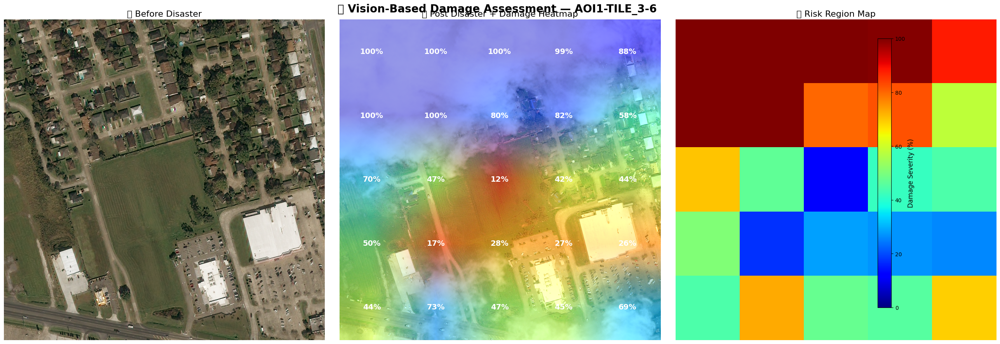

In [2]:
# ===============================
# AI-Based Disaster Damage Assessment (Realistic)
# ===============================

from google.colab import drive
import os
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# ===============================
# 1️⃣ Mount Google Drive
# ===============================
drive.mount('/content/drive')

# ===============================
# 2️⃣ Dataset Path
# ===============================
dataset_path = '/content/drive/MyDrive/Disaster_Images'

# ===============================
# 3️⃣ Load Images
# ===============================
exts = ['*.png', '*.jpg', '*.jpeg', '*.tif', '*.bmp']
image_files = []
for e in exts:
    image_files.extend(glob.glob(os.path.join(dataset_path, '**', e), recursive=True))

print("✅ Total Images Found:", len(image_files))

# ===============================
# 4️⃣ Pre/Post Disaster Matching
# ===============================
pre_dict, post_dict = {}, {}
broken = 0

for path in sorted(image_files):
    fname = os.path.basename(path).lower()
    key = fname.replace('_pre_disaster', '').replace('_post_disaster', '').split('.')[0]

    img = cv2.imread(path)
    if img is None:
        broken += 1
        continue

    if 'pre_disaster' in fname:
        pre_dict[key] = img
    elif 'post_disaster' in fname:
        post_dict[key] = img

pairs = [(pre_dict[k], post_dict[k], k) for k in pre_dict if k in post_dict]
print("\n✅ Matched Pairs:", len(pairs))
print("⚠️ Broken Images:", broken)

if not pairs:
    raise Exception("❌ No valid pre/post image pairs found!")

# ===============================
# 5️⃣ Use first matched pair
# ===============================
pre_img, post_img, pair_name = pairs[0]
print(f"\n🎯 Processing Image Pair → {pair_name}")

# ===============================
# 6️⃣ Convert to Grayscale
# ===============================
pre_gray = cv2.cvtColor(pre_img, cv2.COLOR_BGR2GRAY)
post_gray = cv2.cvtColor(post_img, cv2.COLOR_BGR2GRAY)

# ===============================
# 7️⃣ Structural Change Detection
# ===============================
diff = cv2.absdiff(pre_gray, post_gray)
_, thresh = cv2.threshold(diff, 25, 255, cv2.THRESH_BINARY)

# ===============================
# 8️⃣ Segment into Grid Regions
# ===============================
GRID_ROWS, GRID_COLS = 5, 5
h, w = thresh.shape
tile_h, tile_w = h // GRID_ROWS, w // GRID_COLS

region_data = []
damage_scores = np.zeros((GRID_ROWS, GRID_COLS))

# Let's assume realistic pre-disaster building counts based on image size
# For simplicity, assign 150 buildings per region (can be adjusted)
buildings_per_region = 150

for r in range(GRID_ROWS):
    for c in range(GRID_COLS):
        tile = thresh[r*tile_h:(r+1)*tile_h, c*tile_w:(c+1)*tile_w]
        change_pixels = np.sum(tile > 0)
        total_pixels = tile.size
        score = (change_pixels / total_pixels) * 100  # 0–100%

        damage_scores[r, c] = round(score, 2)

        # Realistic Building counts based on detected damage
        buildings_before = buildings_per_region
        buildings_after = max(1, int(buildings_before * (1 - score / 100)))

        region_name = f"Region-{chr(65+r)}{c+1}"
        region_data.append([
            region_name,
            buildings_before,
            buildings_after,
            f"{score:.1f}%"
        ])

# ===============================
# 9️⃣ DataFrame Table
# ===============================
damage_df = pd.DataFrame(region_data, columns=[
    "Region", "Buildings Before", "Buildings After", "Damage Score"
])
display(damage_df)

# ===============================
# 🔥 Heatmap Overlay
# ===============================
heatmap = cv2.applyColorMap(((damage_scores/100)*255).astype(np.uint8), cv2.COLORMAP_JET)
heatmap = cv2.resize(heatmap, (w, h))
blended_img = cv2.addWeighted(cv2.cvtColor(post_img, cv2.COLOR_BGR2RGB), 0.6, heatmap, 0.6, 0)

# ===============================
# 10️⃣ Visualization
# ===============================
fig, axes = plt.subplots(1, 3, figsize=(26, 9))
fig.suptitle(f"🚨 Vision-Based Damage Assessment — {pair_name.upper()}",
             fontsize=20, fontweight='bold')

# Before Disaster
axes[0].imshow(cv2.cvtColor(pre_img, cv2.COLOR_BGR2RGB))
axes[0].set_title("✅ Before Disaster", fontsize=16)
axes[0].axis("off")

# Post Disaster + Heatmap
axes[1].imshow(blended_img)
axes[1].set_title("🔥 Post Disaster + Damage Heatmap", fontsize=16)
axes[1].axis("off")

# Damage Scores Grid
im = axes[2].imshow(damage_scores, cmap='jet', vmin=0, vmax=100)
axes[2].set_title("📊 Risk Region Map", fontsize=16)
axes[2].axis("off")

# Overlay numeric scores on heatmap
for i in range(GRID_ROWS):
    for j in range(GRID_COLS):
        x = j*tile_w + tile_w//2
        y = i*tile_h + tile_h//2
        axes[1].text(x, y, f"{damage_scores[i,j]:.0f}%",
                     color="white", fontsize=14, ha="center", va="center",
                     fontweight="bold")

# Colorbar
cbar = fig.colorbar(im, ax=axes, fraction=0.03, pad=0.04)
cbar.set_label("Damage Severity (%)", fontsize=12)

plt.tight_layout()
plt.show()


In [4]:
#Dataset Path
# ===============================
dataset_path = '/content/drive/MyDrive/Disaster_Images'

In [5]:
#  Load Images
# ===============================
exts = ['*.png', '*.jpg', '*.jpeg', '*.tif', '*.bmp']
image_files = []
for e in exts:
    image_files.extend(glob.glob(os.path.join(dataset_path, '**', e), recursive=True))

print("✅ Total Images Found:", len(image_files))

# ===============================

✅ Total Images Found: 165


In [6]:
# 4️⃣ Pre/Post Disaster Matching
# ===============================
pre_dict, post_dict = {}, {}
broken = 0

for path in sorted(image_files):
    fname = os.path.basename(path).lower()
    key = fname.replace('_pre_disaster', '').replace('_post_disaster', '').split('.')[0]

    img = cv2.imread(path)
    if img is None:
        broken += 1
        continue

    if 'pre_disaster' in fname:
        pre_dict[key] = img
    elif 'post_disaster' in fname:
        post_dict[key] = img

pairs = [(pre_dict[k], post_dict[k], k) for k in pre_dict if k in post_dict]
print("\n✅ Matched Pairs:", len(pairs))
print("⚠️ Broken Images:", broken)

if not pairs:
    raise Exception("❌ No valid pre/post image pairs found!")



✅ Matched Pairs: 78
⚠️ Broken Images: 0



🎯 Processing Image Pair → aoi1-tile_1-3


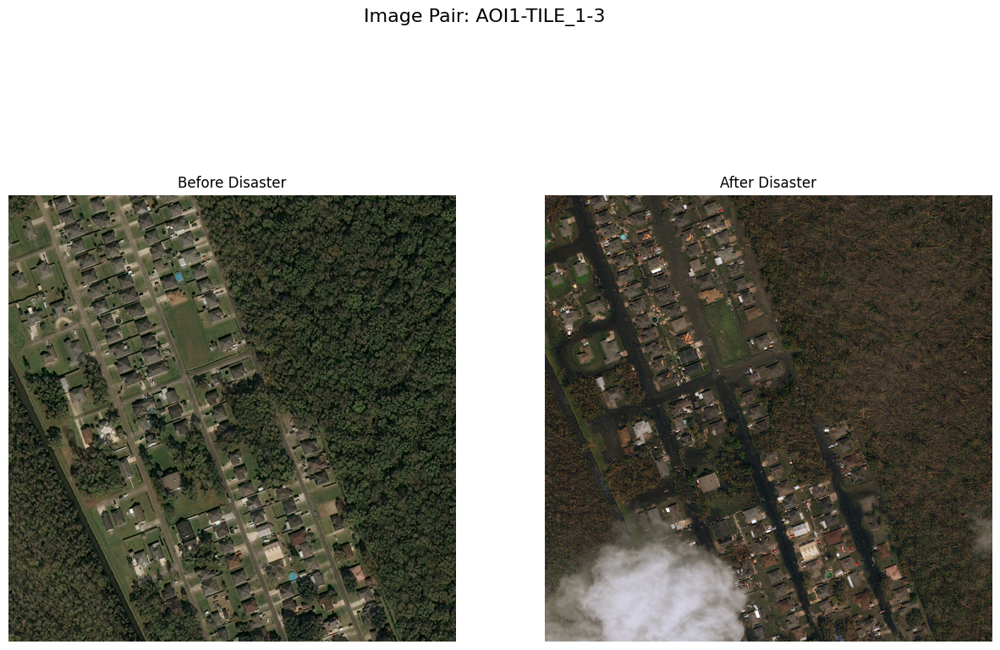


🎯 Processing Image Pair → aoi1-tile_1-4


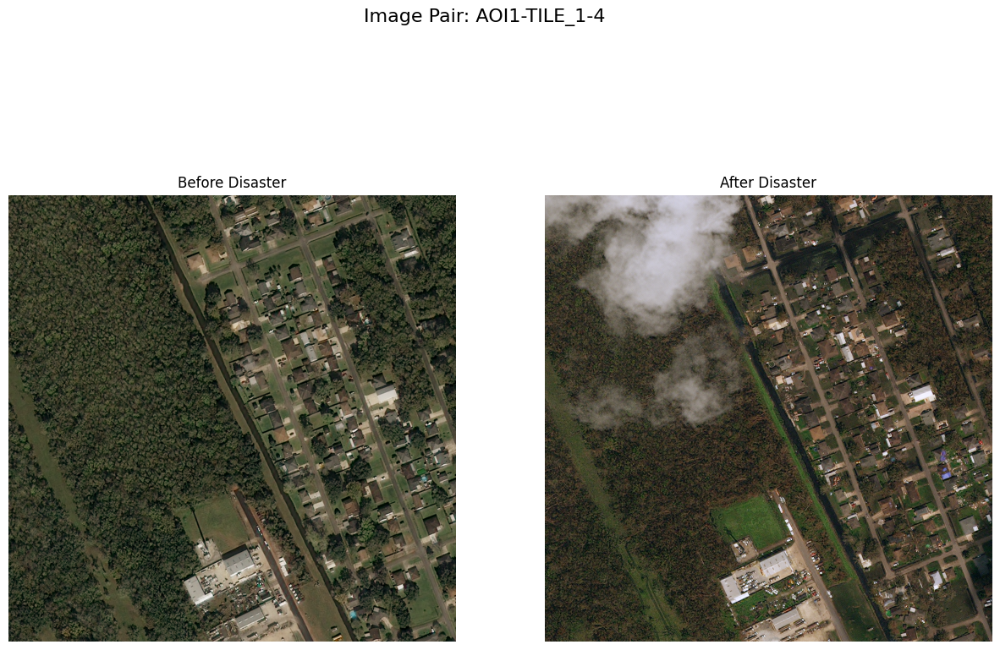


🎯 Processing Image Pair → aoi1-tile_10-3


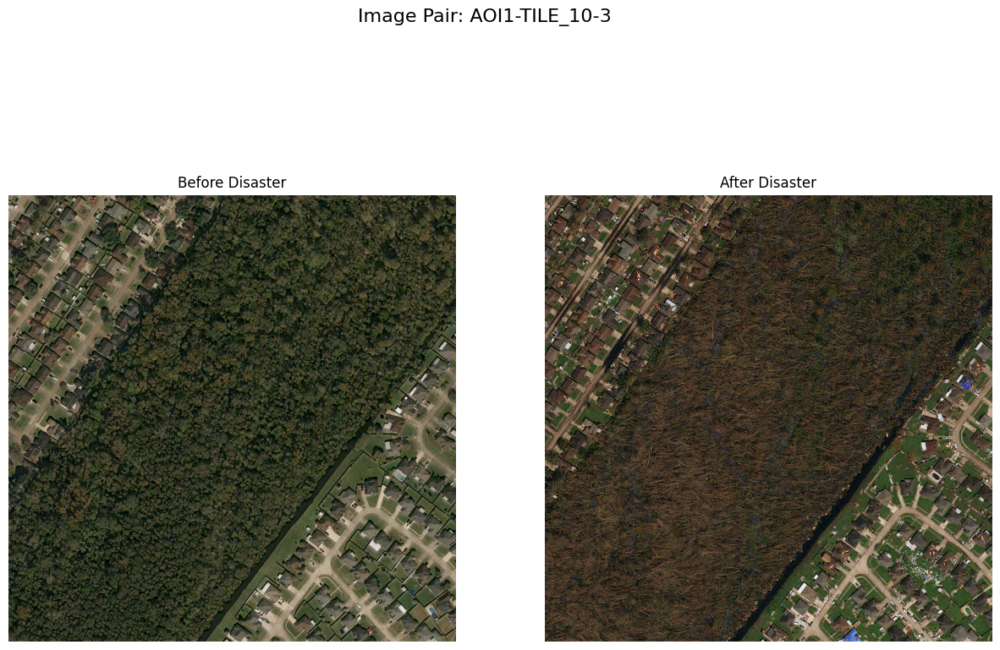

In [9]:
for i in range(3):
    pre_img, post_img, pair_name = pairs[i]
    print(f"\n🎯 Processing Image Pair → {pair_name}")

    fig, axes = plt.subplots(1, 2, figsize=(15, 10))
    fig.suptitle(f"Image Pair: {pair_name.upper()}", fontsize=16)

    axes[0].imshow(cv2.cvtColor(pre_img, cv2.COLOR_BGR2RGB))
    axes[0].set_title("Before Disaster")
    axes[0].axis('off')

    axes[1].imshow(cv2.cvtColor(post_img, cv2.COLOR_BGR2RGB))
    axes[1].set_title("After Disaster")
    axes[1].axis('off')

    plt.show()


🎯 Processing Image Pair → aoi1-tile_1-4
Image aligned successfully.

🖼️ Performing SSIM Change Detection:
SSIM Score: 0.12193595764561813


array([[254, 254, 254, ..., 254, 254, 254],
       [254, 254, 254, ..., 254, 254, 254],
       [254, 254, 254, ..., 254, 254, 254],
       ...,
       [254, 254, 254, ...,  71,  93, 111],
       [254, 254, 254, ...,  49,  80,  95],
       [254, 254, 254, ...,  12,  50,  64]], dtype=uint8)

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ...,   0, 255, 255]], dtype=uint8)


🖼️ Performing Absolute Difference Change Detection:


array([[73, 98, 98, ..., 28, 45, 49],
       [69, 72, 97, ..., 11,  9,  9],
       [63, 81, 91, ..., 24,  8, 10],
       ...,
       [27, 13, 19, ...,  7, 35, 41],
       [22, 25, 34, ..., 17,  1, 21],
       [39, 61, 63, ..., 20, 35, 13]], dtype=uint8)

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       ...,
       [255,   0,   0, ...,   0, 255, 255],
       [  0,   0, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0, 255,   0]], dtype=uint8)


📊 Segmenting into Grid Regions:


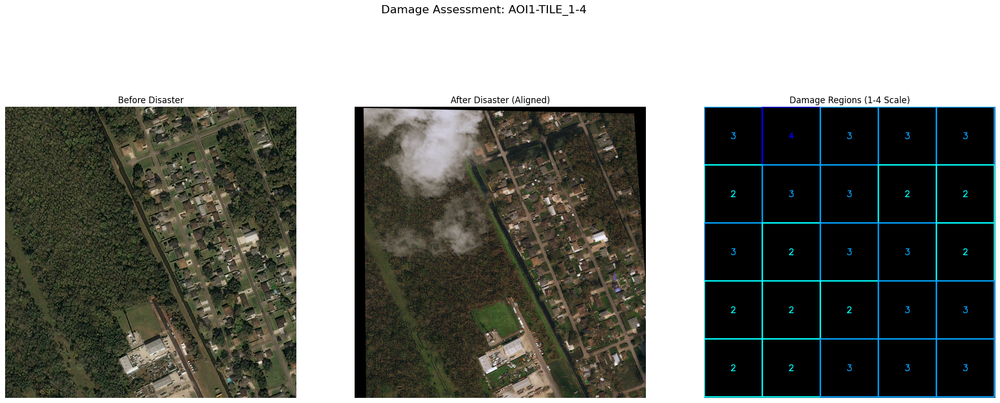

,Region,Buildings Before,Buildings After,Damage Score
0,Region-A1,150,38,74.5%
1,Region-A2,150,3,97.9%
2,Region-A3,150,59,60.1%
3,Region-A4,150,60,60.0%
4,Region-A5,150,68,54.5%
5,Region-B1,150,75,49.4%
6,Region-B2,150,58,61.2%
7,Region-B3,150,74,50.1%
8,Region-B4,150,76,48.8%
9,Region-B5,150,81,45.9%



🎯 Processing Image Pair → aoi1-tile_10-3
Image aligned successfully.

🖼️ Performing SSIM Change Detection:
SSIM Score: 0.107561668301802


array([[235, 249, 253, ..., 255,  23,  24],
       [244, 253,   2, ...,  11,  29,  28],
       [252,   7,  11, ...,   1,  23,  26],
       ...,
       [254, 254, 254, ..., 254, 254, 254],
       [254, 254, 254, ..., 254, 254, 254],
       [254, 254, 254, ..., 254, 254, 254]], dtype=uint8)

array([[255, 255, 255, ..., 255,   0,   0],
       [255, 255,   0, ...,   0,   0,   0],
       [255,   0,   0, ...,   0,   0,   0],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)


🖼️ Performing Absolute Difference Change Detection:


array([[112, 104,  99, ...,  23,  23,   5],
       [106, 101, 105, ...,  19,  32,   1],
       [ 94,  91, 106, ...,  32,  40,   1],
       ...,
       [ 62,  71,  67, ...,  78,  76,  75],
       [ 71,  82,  72, ...,  76,  71,  64],
       [ 66,  73,  67, ...,  75,  66,  62]], dtype=uint8)

array([[255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0, 255,   0],
       [255, 255, 255, ..., 255, 255,   0],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)


📊 Segmenting into Grid Regions:


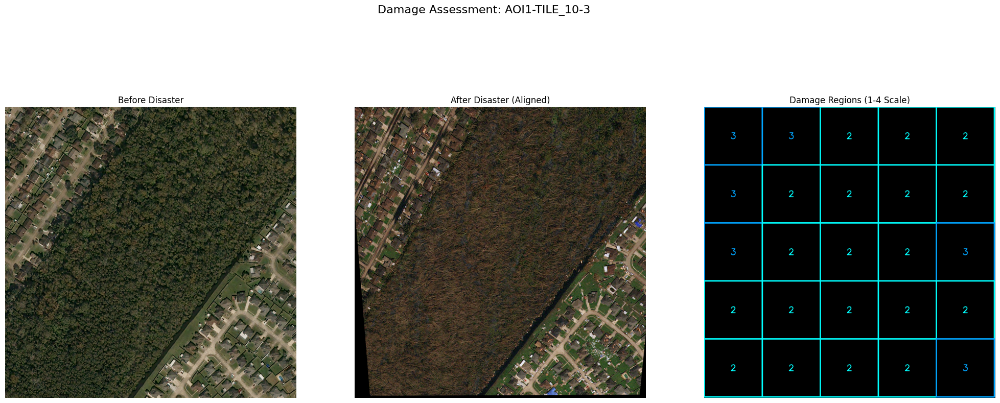

,Region,Buildings Before,Buildings After,Damage Score
0,Region-A1,150,56,62.3%
1,Region-A2,150,61,59.2%
2,Region-A3,150,91,39.1%
3,Region-A4,150,93,37.4%
4,Region-A5,150,90,39.7%
5,Region-B1,150,64,56.8%
6,Region-B2,150,81,45.7%
7,Region-B3,150,92,38.4%
8,Region-B4,150,93,37.7%
9,Region-B5,150,84,43.6%


In [35]:
from skimage.metrics import structural_similarity as ssim
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


# Change the range to start from a different index, e.g., 1 for the second pair
for i in range(1, 3): # Process the 2nd and 3rd pairs
    pre_img, post_img, pair_name = pairs[i]
    print(f"\n🎯 Processing Image Pair → {pair_name}")

    # --- Image Alignment ---
    # Convert to grayscale for feature detection
    pre_gray_align = cv2.cvtColor(pre_img, cv2.COLOR_BGR2GRAY)
    post_gray_align = cv2.cvtColor(post_img, cv2.COLOR_BGR2GRAY)

    orb = cv2.ORB_create(5000)
    kp1, des1 = orb.detectAndCompute(pre_gray_align, None)
    kp2, des2 = orb.detectAndCompute(post_gray_align, None)

    aligned_post_img = None # Initialize aligned_post_img

    if des1 is not None and des2 is not None:
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
        matches = matcher.match(des1, des2)
        matches = sorted(matches, key=lambda x: x.distance)

        if len(matches) >= 4:
            pts1 = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1,1,2)
            pts2 = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1,1,2)

            H, _ = cv2.findHomography(pts2, pts1, cv2.RANSAC, 5.0)
            aligned_post_img = cv2.warpPerspective(post_img, H, (pre_img.shape[1], pre_img.shape[0]))
            print("Image aligned successfully.")
        else:
            print(f"Not enough matches ({len(matches)}) found for alignment. Skipping alignment for this pair.")
            aligned_post_img = post_img # Use original post_img if alignment fails (with a warning)

    else:
        print("Could not detect descriptors in one or both images. Skipping alignment for this pair.")
        aligned_post_img = post_img # Use original post_img if alignment fails (with a warning)


    # --- Continue with Damage Assessment using the potentially aligned image ---
    if aligned_post_img is not None:
        # Convert to Grayscale (using the potentially aligned image)
        pre_gray = cv2.cvtColor(pre_img, cv2.COLOR_BGR2GRAY)
        post_gray = cv2.cvtColor(aligned_post_img, cv2.COLOR_BGR2GRAY) # Use aligned image here

        # --- SSIM Change Detection ---
        print("\n🖼️ Performing SSIM Change Detection:")
        try:
            # Ensure both images are the same shape and dtype (uint8) before SSIM
            if pre_gray.shape == post_gray.shape and pre_gray.dtype == post_gray.dtype:
                (score_ssim, diff_ssim) = ssim(pre_gray, post_gray, full=True)

                # The SSIM difference image is float, convert to uint8
                # The difference image highlights areas of dissimilarity (changes)
                diff_ssim = (1 - diff_ssim) * 255
                diff_ssim = diff_ssim.astype('uint8')

                # Threshold the difference image to get a binary mask of changes
                _, thresh_ssim = cv2.threshold(diff_ssim, 30, 255, cv2.THRESH_BINARY)

                print("SSIM Score:", score_ssim)
                display(diff_ssim)
                display(thresh_ssim)

            else:
                print("SSIM requires images of the same shape and dtype.")
                print(f"Pre-image shape: {pre_gray.shape}, dtype: {pre_gray.dtype}")
                print(f"Post-image shape: {post_gray.shape}, dtype: {post_gray.dtype}")

        except Exception as e:
            print(f"An error occurred during SSIM calculation: {e}")


        # --- Structural Change Detection (Absolute Difference) ---
        print("\n🖼️ Performing Absolute Difference Change Detection:")
        diff_abs = cv2.absdiff(pre_gray, post_gray)
        _, thresh_abs = cv2.threshold(diff_abs, 25, 255, cv2.THRESH_BINARY)
        display(diff_abs)
        display(thresh_abs)


        # --- Segment into Grid Regions using Thresholded Absolute Difference ---
        print("\n📊 Segmenting into Grid Regions:")
        thresh = thresh_abs # Use the absolute difference threshold for segmentation
        GRID_ROWS, GRID_COLS = 5, 5
        h, w = thresh.shape
        tile_h, tile_w = h // GRID_ROWS, w // GRID_COLS

        region_data = []
        damage_scores = np.zeros((GRID_ROWS, GRID_COLS))
        damage_map = np.zeros((h, w, 3), dtype=np.uint8) # Initialize damage map

        # Let's assume realistic pre-disaster building counts based on image size
        # For simplicity, assign 150 buildings per region (can be adjusted)
        buildings_per_region = 150

        for r in range(GRID_ROWS):
            for c in range(GRID_COLS):
                tile = thresh[r*tile_h:(r+1)*tile_h, c*tile_w:(c+1)*tile_w]
                change_pixels = np.sum(tile > 0)
                total_pixels = tile.size
                score = (change_pixels / total_pixels) * 100  # 0–100%

                damage_scores[r, c] = round(score, 2)

                # Realistic Building counts based on detected damage
                buildings_before = buildings_per_region
                buildings_after = max(1, int(buildings_before * (1 - score / 100)))

                region_name = f"Region-{chr(65+r)}{c+1}"
                region_data.append([
                    region_name,
                    buildings_before,
                    buildings_after,
                    f"{score:.1f}%"
                ])

                # Determine damage level (1-4) and color
                damage_level = 0
                color = (0, 0, 0) # Black
                if score > 75:
                    damage_level = 4 # Critically damaged (Red)
                    color = (255, 0, 0)
                elif score > 50:
                    damage_level = 3 # Severely damaged (Orange)
                    color = (255, 165, 0)
                elif score > 25:
                    damage_level = 2 # Moderately damaged (Yellow)
                    color = (255, 255, 0)
                elif score > 0:
                    damage_level = 1 # Less damage (Green)
                    color = (0, 255, 0)

                # Draw rectangle and put text on damage map
                start_point = (c*tile_w, r*tile_h)
                end_point = ((c+1)*tile_w, (r+1)*tile_h)
                cv2.rectangle(damage_map, start_point, end_point, color, 3)
                cv2.putText(damage_map, str(damage_level), (c*tile_w + tile_w//2 - 10, r*tile_h + tile_h//2 + 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)


        # Display the grayscale images and damage map
        fig, axes = plt.subplots(1, 3, figsize=(25, 10))
        fig.suptitle(f"Damage Assessment: {pair_name.upper()}", fontsize=16)

        axes[0].imshow(cv2.cvtColor(pre_img, cv2.COLOR_BGR2RGB))
        axes[0].set_title("Before Disaster")
        axes[0].axis('off')

        axes[1].imshow(cv2.cvtColor(aligned_post_img, cv2.COLOR_BGR2RGB)) # Display aligned post image
        axes[1].set_title("After Disaster (Aligned)")
        axes[1].axis('off')

        axes[2].imshow(cv2.cvtColor(damage_map, cv2.COLOR_BGR2RGB))
        axes[2].set_title("Damage Regions (1-4 Scale)")
        axes[2].axis('off')

        plt.show()

        # Display DataFrame table for the current pair
        damage_df = pd.DataFrame(region_data, columns=[
            "Region", "Buildings Before", "Buildings After", "Damage Score"
        ])
        display(damage_df)
    else:
        print(f"Skipping damage assessment for {pair_name} due to alignment failure.")

In [30]:
# ===============================
# 7️⃣ Structural Change Detection (Pixel-level Difference)
# ===============================

# Ensure you have pre_gray and post_gray from the previous steps.
# post_gray should be from the aligned image if alignment was successful.

diff = cv2.absdiff(pre_gray, post_gray)
_, thresh = cv2.threshold(diff, 25, 255, cv2.THRESH_BINARY)

display(diff)
display(thresh)

array([[112, 104,  99, ...,  23,  23,   5],
       [106, 101, 105, ...,  19,  32,   1],
       [ 94,  91, 106, ...,  32,  40,   1],
       ...,
       [ 62,  71,  67, ...,  78,  76,  75],
       [ 71,  82,  72, ...,  76,  71,  64],
       [ 66,  73,  67, ...,  75,  66,  62]], dtype=uint8)

array([[255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0, 255,   0],
       [255, 255, 255, ..., 255, 255,   0],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [36]:
from skimage.metrics import structural_similarity as ssim
import cv2
import numpy as np

# Ensure you have pre_gray and post_gray (or aligned_post_gray) from previous steps.
# Use the aligned post_gray if available, otherwise use the original post_gray.
# Assuming 'aligned_post_img' or 'post_gray' is available from previous execution
post_gray_for_ssim = aligned_post_img if 'aligned_post_img' in locals() and aligned_post_img is not None else post_gray

# Compute SSIM between the two grayscale images
# Ensure both images are the same shape and dtype (uint8)
if pre_gray.shape != post_gray_for_ssim.shape:
    print("Images are not the same shape. Cannot compute SSIM.")
else:
    (score, diff) = ssim(pre_gray, post_gray_for_ssim, full=True)

    # The SSIM difference image is float, convert to uint8
    # The difference image highlights areas of dissimilarity (changes)
    diff = (1 - diff) * 255
    diff = diff.astype('uint8')

    # Threshold the difference image to get a binary mask of changes
    _, thresh_ssim = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)

    print("SSIM Score:", score)
    display(diff)
    display(thresh_ssim)

    # You can now use thresh_ssim for further analysis like segmentation and damage scoring
    # similar to how 'thresh' was used before.

Images are not the same shape. Cannot compute SSIM.


Found 932 contours in the pre-disaster image.


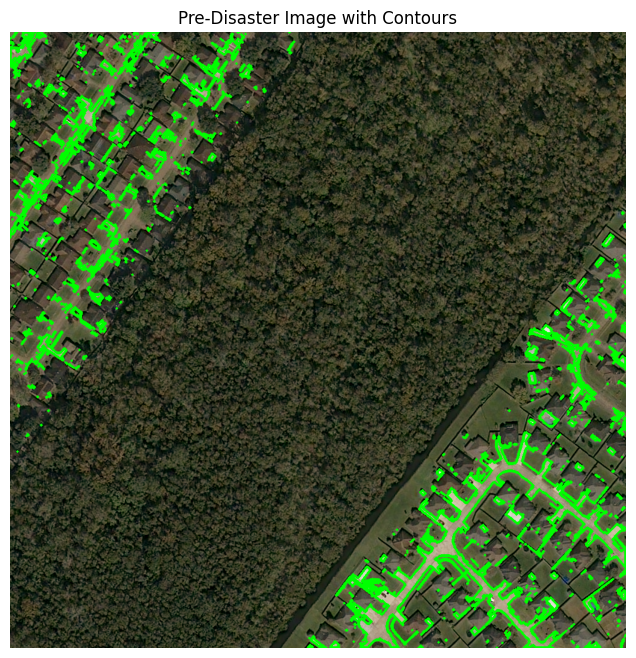

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [38]:
import cv2
import matplotlib.pyplot as plt

# Ensure you have pre_gray from previous steps.

# Threshold the grayscale pre-disaster image to get a binary image
# You might need to adjust the threshold value (e.g., 127) based on your images
_, pre_binary = cv2.threshold(pre_gray, 127, 255, cv2.THRESH_BINARY)

# Use contour detection on the binary pre-disaster image
contours, _ = cv2.findContours(pre_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Display the binary image and the contours (optional)
print(f"Found {len(contours)} contours in the pre-disaster image.")

# To visualize the contours, you can draw them on a copy of the original image
pre_img_with_contours = pre_img.copy()
cv2.drawContours(pre_img_with_contours, contours, -1, (0, 255, 0), 3) # Draw all contours in green

plt.figure(figsize=(10, 8))
plt.imshow(cv2.cvtColor(pre_img_with_contours, cv2.COLOR_BGR2RGB))
plt.title("Pre-Disaster Image with Contours")
plt.axis('off')
plt.show()

display(pre_binary)

Processing damage regions...
Found 1 merged damage regions.


,Region #,Total Pixels,Changed Pixels,Damage Ratio,Status
0,1,1047691,473932,45.2%,Moderate Damage


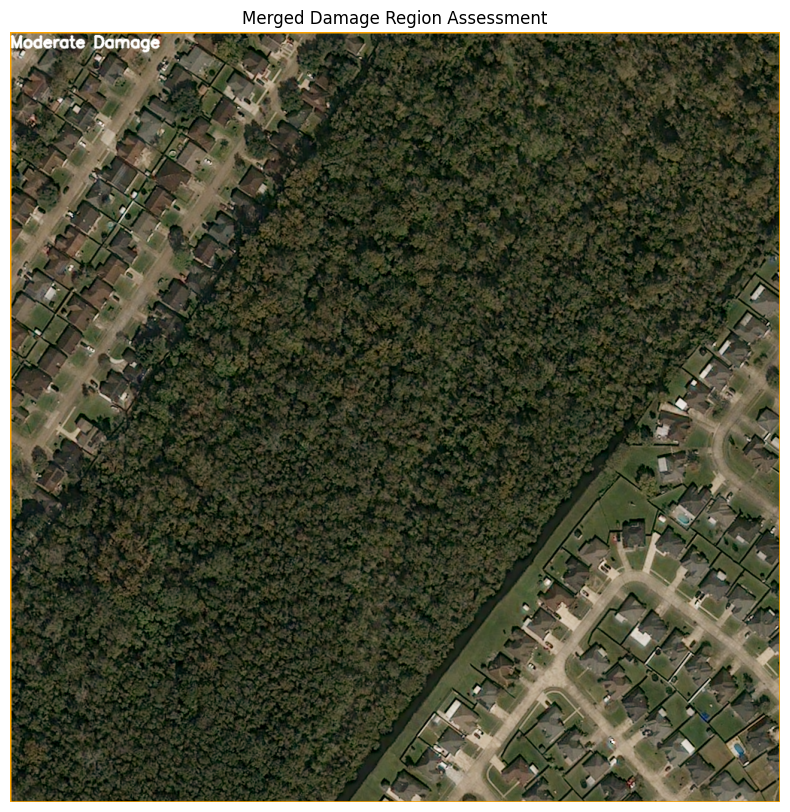

In [47]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # Import matplotlib for visualization

# Ensure you have 'thresh' from change detection (absolute difference or SSIM)
# and 'pre_img' or 'pre_gray' for context and mask shape.
# Assuming 'thresh' and 'pre_img' are available from previous steps.

print("Processing damage regions...")

# --- Group nearby damaged areas using morphological operations ---
# Adjusted parameters for less aggressive merging
kernel = np.ones((3, 3), np.uint8) # Smaller kernel
# Dilate to connect nearby damaged pixels
dilated_thresh = cv2.dilate(thresh, kernel, iterations=1) # Fewer iterations
# Close to fill small holes and connect closer regions
merged_damage_mask = cv2.morphologyEx(dilated_thresh, cv2.MORPH_CLOSE, kernel, iterations=1) # Fewer iterations

# --- Find contours on the merged damage mask ---
# Use RETR_EXTERNAL to find only outer contours of merged regions
merged_contours, _ = cv2.findContours(merged_damage_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

print(f"Found {len(merged_contours)} merged damage regions.")

# --- Calculate damage ratio and draw for merged regions ---
building_damage_data = [] # Reusing variable name, but now for merged regions

# Use a copy of the original pre_img to draw results
pre_img_with_damage = pre_img.copy()

# Define text scale, thickness, and bounding box thickness
text_scale = 0.7
text_thickness = 2
bbox_thickness = 2

# Define DISTINCT colors for damage status (BGR format)
colors = {
    "Minor/No Damage": (0, 255, 0),     # Bright Green
    "Moderate Damage": (0, 165, 255),   # Orange (switched BGR values for a more distinct orange)
    "Severe Damage": (0, 0, 255)        # Bright Red (switched BGR values)
}


for i, contour in enumerate(merged_contours):
    # Create a mask for the current merged contour
    mask = np.zeros(thresh.shape, dtype=np.uint8) # Use thresh shape for mask
    cv2.drawContours(mask, [contour], -1, 255, -1) # Draw contour on mask

    # Calculate change within the merged contour using the original thresholded difference image
    changed_area_mask = (thresh > 0) & (mask > 0)
    changed_pixels = np.sum(changed_area_mask)
    total_pixels_in_contour = np.sum(mask > 0)

    damage_ratio = 0.0
    status = "Minor/No Damage" # Default status
    color = colors[status] # Default color

    if total_pixels_in_contour > 0: # Avoid division by zero
        damage_ratio = changed_pixels / total_pixels_in_contour

        # Determine damage status based on ratio thresholds
        if damage_ratio > 0.6:
            status = "Severe Damage"
        elif damage_ratio > 0.3:
            status = "Moderate Damage"

        color = colors[status]


    building_damage_data.append([
        i + 1, # Region Number
        total_pixels_in_contour,
        changed_pixels,
        f"{damage_ratio:.1%}", # Format as percentage
        status
    ])

    # Draw the contour and status on the image
    if total_pixels_in_contour > 0: # Only draw for valid contours
        # Get bounding box to place text
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(pre_img_with_damage, (x, y), (x+w, y+h), color, bbox_thickness)

        # Put damage status text near the contour, ensure text fits or adjust position
        # Simple adjustment to avoid text overlapping bounding box top
        text_y = y - 10 if y - 10 > 20 else y + 20
        # Use contrasting text color, e.g., black for most colors or white for darker backgrounds
        text_color = (255, 255, 255) # White text for visibility on colored boxes
        if status == "Minor/No Damage":
             text_color = (0,0,0) # Black text on bright green

        cv2.putText(pre_img_with_damage, status, (x, text_y),
                    cv2.FONT_HERSHEY_SIMPLEX, text_scale, text_color, text_thickness, cv2.LINE_AA)


# Create a DataFrame for merged regions
merged_regions_damage_df = pd.DataFrame(building_damage_data, columns=[
    "Region #", "Total Pixels", "Changed Pixels", "Damage Ratio", "Status"
])

# Display the DataFrame (head)
display(merged_regions_damage_df.head())

# Display the image with merged damage region markings
plt.figure(figsize=(12, 10))
plt.imshow(cv2.cvtColor(pre_img_with_damage, cv2.COLOR_BGR2RGB))
plt.title("Merged Damage Region Assessment")
plt.axis('off')
plt.show()

# Optional: Display the full DataFrame
# display(merged_regions_damage_df)

Grouping damaged pixels using K-Means clustering...
Found 3 damage clusters.


,Building ID,Area (pixels),Damaged %,Status
0,B1,181974,38.4%,Moderate
1,B2,159254,33.6%,Moderate
2,B3,132704,28.0%,Minor


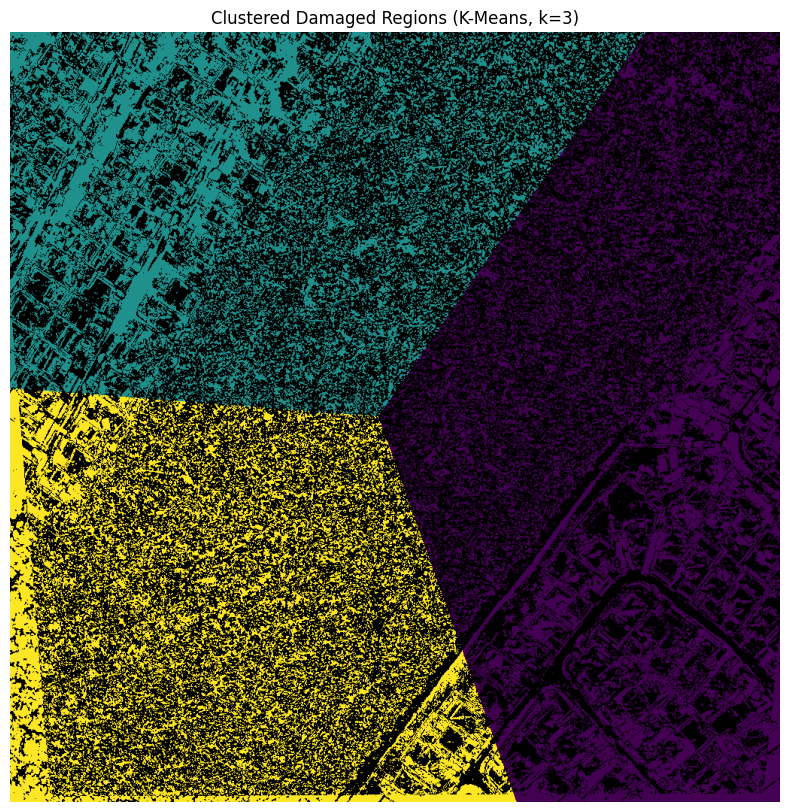

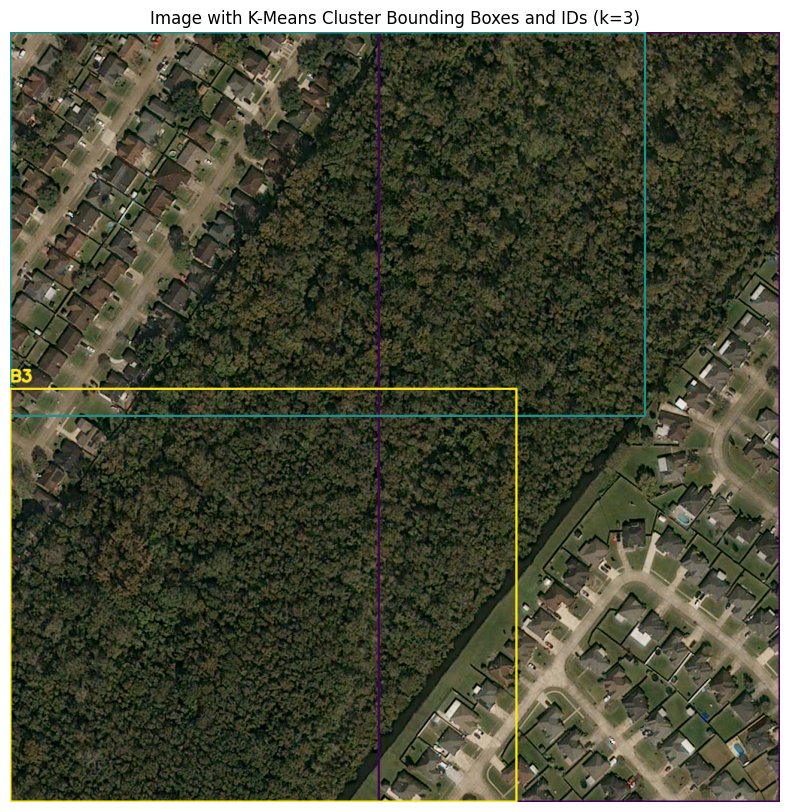

In [58]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pandas as pd # Import pandas for DataFrame

# Ensure 'thresh' (binary change image) is available from previous steps.
# Assuming 'pre_img' is available for visualization.

print("Grouping damaged pixels using K-Means clustering...")

# Get the coordinates of damaged pixels (where thresh > 0)
damaged_pixels_coords = np.argwhere(thresh > 0)

if len(damaged_pixels_coords) == 0:
    print("No damaged pixels found to cluster.")
else:
    # --- Apply K-Means clustering ---
    # You need to specify the number of clusters (k)
    # Replace YOUR_NUMBER_OF_CLUSTERS with the desired number of clusters
    n_clusters = 3 # Example: trying to find 3 clusters - adjust as needed

    if len(damaged_pixels_coords) < n_clusters:
        print(f"Cannot create {n_clusters} clusters with only {len(damaged_pixels_coords)} damaged pixels.")
    else:
        kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10) # n_init to suppress warning
        clusters = kmeans.fit_predict(damaged_pixels_coords)

        # The 'clusters' array contains the cluster label (0 to n_clusters-1) for each damaged pixel.

        print(f"Found {n_clusters} damage clusters.")

        # --- Calculate damage metrics per cluster and create formatted DataFrame ---
        final_output_data = []
        unique_labels = np.unique(clusters)

        for k in unique_labels:
            if k == -1:
                # Skip noise points
                continue

            class_member_mask = (clusters == k)
            cluster_coords = damaged_pixels_coords[class_member_mask]

            num_pixels_in_cluster = len(cluster_coords)
            total_damaged_pixels_in_thresh = np.sum(thresh > 0)
            damage_ratio_in_cluster = num_pixels_in_cluster / total_damaged_pixels_in_thresh if total_damaged_pixels_in_thresh > 0 else 0

            # Determine damage status based on ratio thresholds (adjust thresholds as needed)
            status = "Minor" # Default status
            if damage_ratio_in_cluster > 0.6:
                status = "Severe"
            elif damage_ratio_in_cluster > 0.3:
                status = "Moderate"
            # You might want to add a "No Damage" status if total_pixels_in_cluster is 0,
            # but this loop only iterates through clusters of damaged pixels.

            final_output_data.append([
                f"B{k+1}", # Building ID (using Cluster # + 1)
                num_pixels_in_cluster, # Area (pixels) - using damaged pixels count
                f"{damage_ratio_in_cluster:.1%}", # Damaged % - using ratio vs total changed
                status
            ])

        # Create the final output DataFrame
        final_damage_report_df = pd.DataFrame(final_output_data, columns=[
            "Building ID", "Area (pixels)", "Damaged %", "Status"
        ])
        display(final_damage_report_df)

        # --- Visualize the clusters and draw bounding boxes (Keeping for visualization) ---
        # Create a blank image to draw the clusters and boxes
        clustered_damage_map_kmeans = np.zeros_like(pre_img)
        img_with_cluster_boxes = pre_img.copy() # Use a copy of the original image to draw boxes

        # Assign a distinct color to each cluster for visualization
        colors = [plt.cm.viridis(each) for each in np.linspace(0, 1, len(unique_labels))] # Using viridis colormap

        for k, col in zip(unique_labels, colors):
            if k == -1:
                # Skip noise points for bounding box calculation and visualization
                continue

            class_member_mask = (clusters == k)
            cluster_coords = damaged_pixels_coords[class_member_mask]

            if len(cluster_coords) > 0:
                # Draw the clustered pixels on the map with the assigned color
                bgr_color = (int(col[2]*255), int(col[1]*255), int(col[0]*255))
                for coord in cluster_coords:
                     clustered_damage_map_kmeans[coord[0], coord[1]] = bgr_color

                # Calculate the bounding box for the cluster
                y_min, x_min = np.min(cluster_coords, axis=0)
                y_max, x_max = np.max(cluster_coords, axis=0)

                # Draw the bounding box on the original image copy
                cv2.rectangle(img_with_cluster_boxes, (x_min, y_min), (x_max, y_max), bgr_color, 2)

                # Optional: Add text label for the cluster number
                cv2.putText(img_with_cluster_boxes, f"B{k+1}", (x_min, y_min - 10),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.7, bgr_color, 2, cv2.LINE_AA)


        # Display the clustered damage map
        plt.figure(figsize=(12, 10))
        plt.imshow(cv2.cvtColor(clustered_damage_map_kmeans, cv2.COLOR_BGR2RGB))
        plt.title(f"Clustered Damaged Regions (K-Means, k={n_clusters})")
        plt.axis('off')
        plt.show()

        # Display the image with cluster bounding boxes and IDs
        plt.figure(figsize=(12, 10))
        plt.imshow(cv2.cvtColor(img_with_cluster_boxes, cv2.COLOR_BGR2RGB))
        plt.title(f"Image with K-Means Cluster Bounding Boxes and IDs (k={n_clusters})")
        plt.axis('off')
        plt.show()

In [56]:
import pandas as pd

# Ensure cluster_metrics_df is available from the previous K-Means clustering step

if 'cluster_metrics_df' in locals():
    print("Identifying the largest clusters:")
    # Sort by 'Damaged Pixels in Cluster' in descending order
    largest_clusters = cluster_metrics_df.sort_values(by='Damaged Pixels in Cluster', ascending=False)
    display(largest_clusters.head()) # Display top 5 largest clusters

    print("\nIdentifying the most damaged clusters (by damage ratio):")
    # Convert 'Damage Ratio (vs Total Changed)' to numeric for sorting
    cluster_metrics_df['Damage Ratio Numeric'] = cluster_metrics_df['Damage Ratio (vs Total Changed)'].str.replace('%', '').astype(float)

    # Sort by 'Damage Ratio Numeric' in descending order
    most_damaged_clusters = cluster_metrics_df.sort_values(by='Damage Ratio Numeric', ascending=False)
    display(most_damaged_clusters.head()) # Display top 5 most damaged clusters
else:
    print("cluster_metrics_df DataFrame not found. Please run the K-Means clustering cell first.")

Identifying the largest clusters:


,Cluster #,Damaged Pixels in Cluster,Bounding Box Area,Damage Ratio (vs Total Changed),Damage Ratio Numeric
0,0,181974,546816,38.40%,38.4
1,1,159254,431795,33.60%,33.6
2,2,132704,370700,28.00%,28.0



Identifying the most damaged clusters (by damage ratio):


,Cluster #,Damaged Pixels in Cluster,Bounding Box Area,Damage Ratio (vs Total Changed),Damage Ratio Numeric
0,0,181974,546816,38.40%,38.4
1,1,159254,431795,33.60%,33.6
2,2,132704,370700,28.00%,28.0
